# CementStrengthPrediction

In [15]:
! pip install ydata-profiling
from ydata_profiling import ProfileReport
import pandas as pd

df = pd.read_excel("Concrete_Data.xls")

# Generate the profile report
profile = ProfileReport(df, title='Pandas Profiling Report')

# Display the report as widgets
profile.to_widgets()


/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:524: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

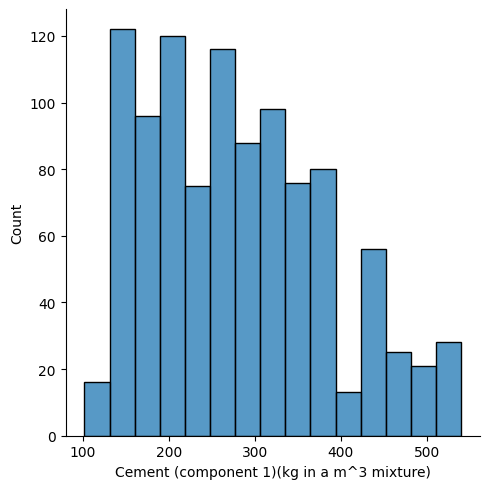

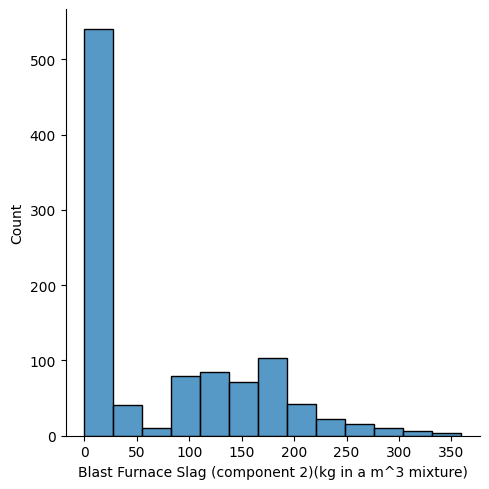

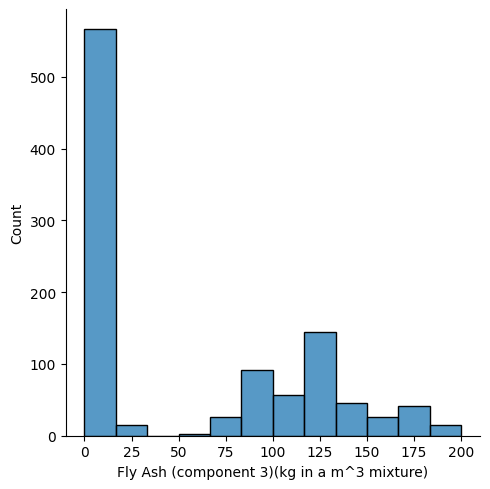

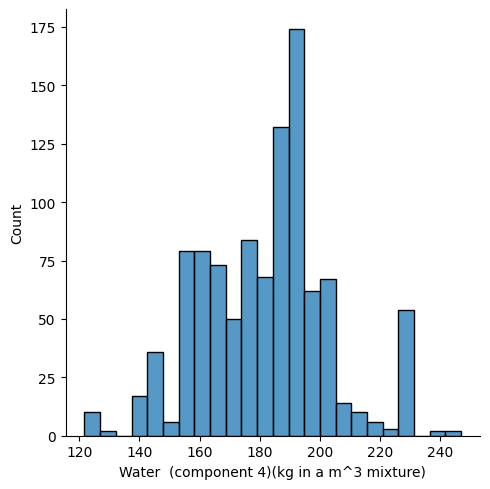

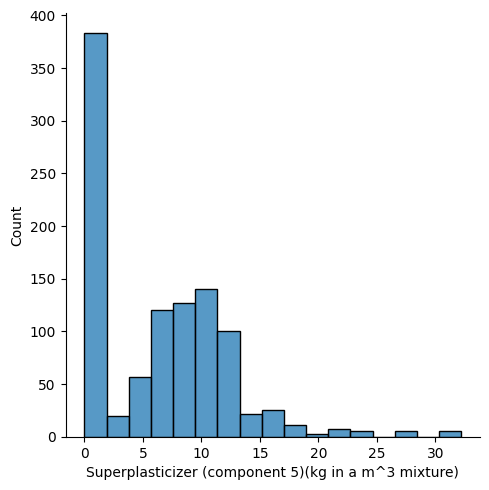

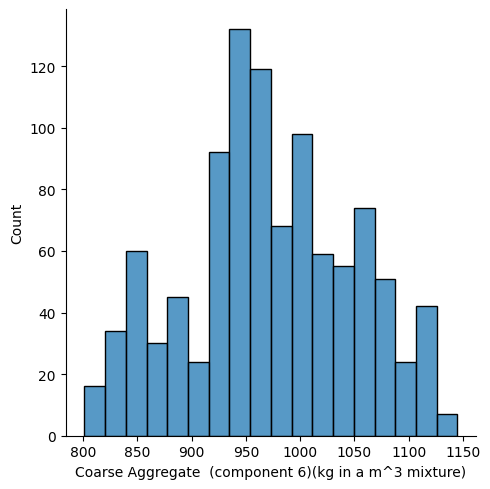

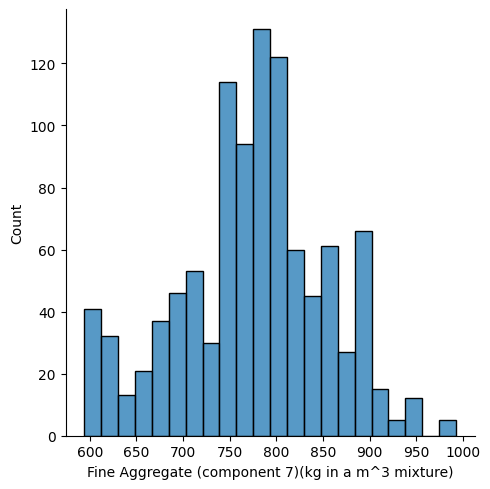

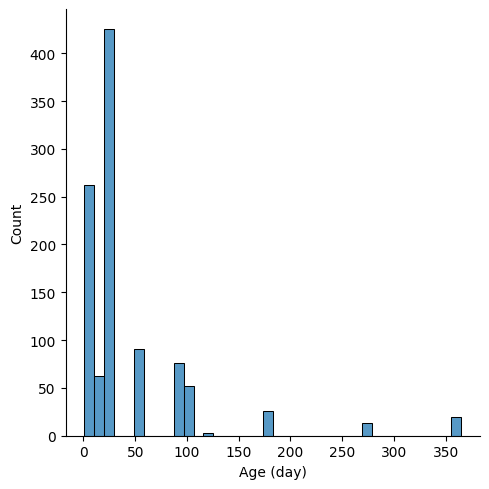

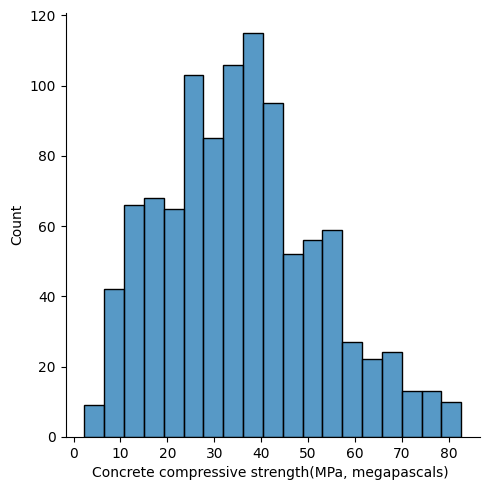

In [23]:
## We can plot manually also
import seaborn as sns
import matplotlib.pyplot as plt
for col in df.columns:
  sns.displot(df[col])
  plt.show()

In [25]:
df.columns

Index(['Cement (component 1)(kg in a m^3 mixture)',
       'Blast Furnace Slag (component 2)(kg in a m^3 mixture)',
       'Fly Ash (component 3)(kg in a m^3 mixture)',
       'Water  (component 4)(kg in a m^3 mixture)',
       'Superplasticizer (component 5)(kg in a m^3 mixture)',
       'Coarse Aggregate  (component 6)(kg in a m^3 mixture)',
       'Fine Aggregate (component 7)(kg in a m^3 mixture)', 'Age (day)',
       'Concrete compressive strength(MPa, megapascals) '],
      dtype='object')

In [26]:
# segregate X and y variables
X=df.drop('Concrete compressive strength(MPa, megapascals) ',axis=1)
y=df['Concrete compressive strength(MPa, megapascals) ']

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.25,random_state=42)

In [27]:
# Scaling the data
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [29]:

# model building

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

model1=LinearRegression()
model2=Ridge()
model3=Lasso()
model4=RandomForestRegressor()
model5=GradientBoostingRegressor()

model1.fit(X_train_scaled,y_train)
model2.fit(X_train_scaled,y_train)
model3.fit(X_train_scaled,y_train)
model4.fit(X_train_scaled,y_train)
model5.fit(X_train_scaled,y_train)

GradientBoostingRegressor()

In [32]:
y_pred1=model1.predict(X_test_scaled)
y_pred2=model2.predict(X_test_scaled)
y_pred3=model3.predict(X_test_scaled)
y_pred4=model4.predict(X_test_scaled)
y_pred5=model5.predict(X_test_scaled)

In [34]:
mse1=mean_squared_error(y_test, y_pred1)
mse2=mean_squared_error(y_test, y_pred2)
mse3=mean_squared_error(y_test, y_pred3)
mse4=mean_squared_error(y_test, y_pred4)
mse5=mean_squared_error(y_test, y_pred5)

print(f"linear: {mse1}, ridge: {mse2}, lasso: {mse3}, randomforest: {mse4}, gradient: {mse5}")

linear: 101.59690956892418, ridge: 101.52825133235565, lasso: 119.85954620698178, randomforest: 29.674514961847954, gradient: 30.01033013930788


In [36]:
r21=r2_score(y_test, y_pred1)
r22=r2_score(y_test, y_pred2)
r23=r2_score(y_test, y_pred3)
r24=r2_score(y_test, y_pred4)
r25=r2_score(y_test, y_pred5)

print(f"linear: {r21}, ridge: {r22}, lasso: {r23}, randomforest: {r24}, gradient: {r25}")

linear: 0.6249292900326934, ridge: 0.6251827592931671, lasso: 0.5575081438701296, randomforest: 0.8904490161964517, gradient: 0.8892092694604327


### RandomForest is the best model as it is giving maximum accuracy.

In [41]:
## Hyperparameter Tuning

param_grid = {
    'max_depth': [10, 50,100, 110, None],
    'max_features': ["sqrt", "log2", None],
    'min_samples_split': [ 5,8,10],
    'min_samples_leaf': [1,5, 10],
}

from sklearn.model_selection import GridSearchCV
reg=GridSearchCV(model4,param_grid=param_grid,cv=3, verbose=2)

In [42]:
reg.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 135 candidates, totalling 405 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   0.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=8; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_dep

GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [10, 50, 100, 110, None],
                         'max_features': ['sqrt', 'log2', None],
                         'min_samples_leaf': [1, 5, 10],
                         'min_samples_split': [5, 8, 10]},
             verbose=2)

In [46]:
pred6=reg.predict(X_test_scaled)

In [47]:
r26=r2_score(y_test, pred6)

In [48]:
r26

0.8870586150806036

we will use RandomForestRegressor for this Project.

# The End